<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Make-elliptical-models" data-toc-modified-id="Make-elliptical-models-1">Make elliptical models</a></span><ul class="toc-item"><li><span><a href="#Step-1:-Fit-F850LP" data-toc-modified-id="Step-1:-Fit-F850LP-1.1">Step 1: Fit F850LP</a></span></li><li><span><a href="#Step-2:-Use-F850LP-isophotes-to-fit-F475W" data-toc-modified-id="Step-2:-Use-F850LP-isophotes-to-fit-F475W-1.2">Step 2: Use F850LP isophotes to fit F475W</a></span></li><li><span><a href="#Step-3:-Build-detailed-inner-model" data-toc-modified-id="Step-3:-Build-detailed-inner-model-1.3">Step 3: Build detailed inner model</a></span></li><li><span><a href="#Step-4:-Manually-interpolate-outer-ellipses" data-toc-modified-id="Step-4:-Manually-interpolate-outer-ellipses-1.4">Step 4: Manually interpolate outer ellipses</a></span></li><li><span><a href="#Step-5:-Save-RESID-maps" data-toc-modified-id="Step-5:-Save-RESID-maps-1.5">Step 5: Save RESID maps</a></span></li><li><span><a href="#Step-6:-Classify-regions-(by-isophote)" data-toc-modified-id="Step-6:-Classify-regions-(by-isophote)-1.6">Step 6: Classify regions (by isophote)</a></span></li><li><span><a href="#Step-7:-Find-unmasked-points" data-toc-modified-id="Step-7:-Find-unmasked-points-1.7">Step 7: Find unmasked points</a></span></li></ul></li></ul></div>

In [1]:
import numpy as np, matplotlib.pyplot as plt, matplotlib as mpl, pcmdpy as ppy
from astropy.io import fits
import matplotlib.gridspec as gridspec
from mpl_toolkits.axes_grid1.inset_locator import mark_inset
from tqdm import tqdm_notebook as tqdm
import pyregion
from photutils.isophote import EllipseGeometry, Ellipse
from photutils import EllipticalAperture
from photutils.isophote import build_ellipse_model
from photutils.isophote import EllipseSample, Isophote, IsophoteList
from photutils.isophote.isophote import Isophote, IsophoteList
import sep
%matplotlib inline

GPU acceleration not available, sorry
No module named 'pycuda'


In [2]:
plt.style.use('seaborn-poster')

In [3]:
pix_in_pc = (0.05 / 3600.) * np.pi / 180. * 1.8e7

In [4]:
f = ppy.instrument.default_m49_filters()

In [5]:
with fits.open('../data/hst_9401_01_acs_wfc_f850lp_drz.fits') as hdu:
    im_F850LP = hdu['SCI'].data * f[0]._exposure
    mask_F850LP = (hdu['WHT'].data <= 0.)
    header_F850LP = hdu['PRIMARY'].header

In [6]:
with fits.open('../data/hst_9401_01_acs_wfc_f475w_drz.fits') as hdu:
    im_F475W = hdu['SCI'].data * f[1]._exposure
    mask_F475W = (hdu['WHT'].data <= 0.)
    header_F475W = hdu['PRIMARY'].header

In [7]:
im_shape = im_F850LP.shape

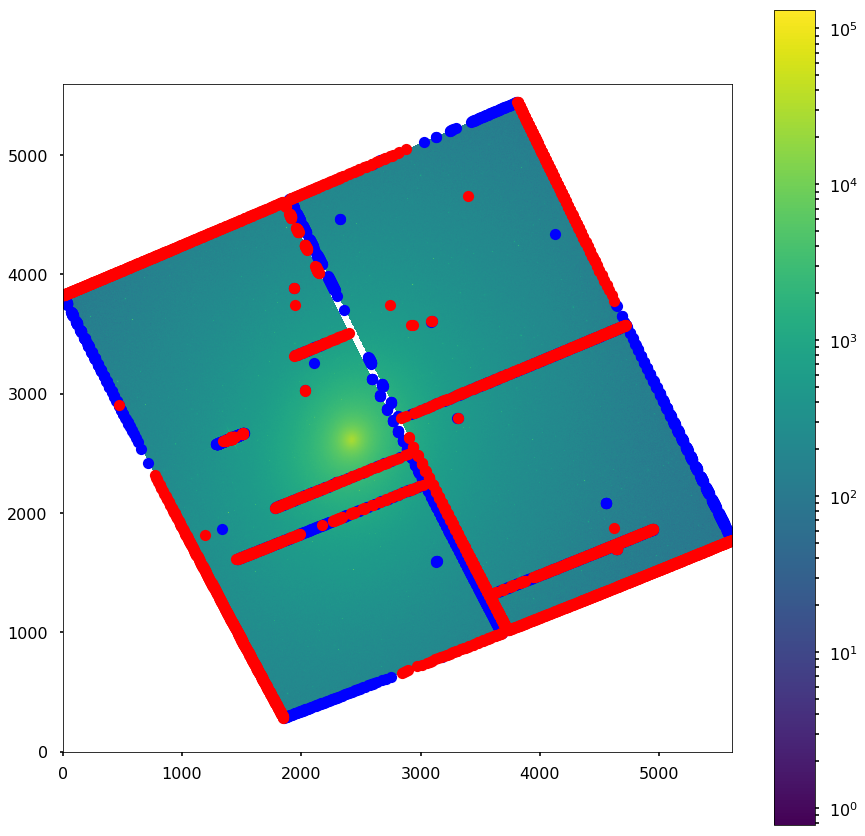

In [8]:
fig, axis = plt.subplots(figsize=(15,15))
plt.imshow(im_F850LP, origin='lower', norm=mpl.colors.LogNorm())
ys, xs = np.where(mask_F475W > mask_F850LP)
plt.plot(xs, ys, 'bo')
ys, xs = np.where(mask_F475W < mask_F850LP)
plt.plot(xs, ys, 'ro')
plt.colorbar()

In [14]:
mask = mask_F850LP + mask_F475W
mask += (im_F475W <= 0.)
mask += (im_F850LP <= 0.)
star_cutout = pyregion.open('../data/star_large.reg').as_imagecoord(header=header_F850LP).get_mask(shape=im_shape)
mask += star_cutout

In [17]:
%%time
ds9_mask = pyregion.open('../data/contours_F475W.reg').as_imagecoord(header=header_F475W).get_mask(shape=im_shape)

KeyboardInterrupt: 

In [10]:
results = np.loadtxt('../data/hst_9401_01_acs_wfc_f475w_daophot_trm.cat', unpack=True)
x1 = results[0]
y1 = results[1]

In [11]:
results = np.loadtxt('../data/hst_9401_01_acs_wfc_f850lp_daophot_trm.cat', unpack=True)
x2 = results[0]
y2 = results[1]

In [12]:
# with open('../data/m49_f475w.reg', 'w') as f:
#     f.write('# Region file format: DS9 version 4.1\n')
#     f.write('global color=green dashlist=8 3 width=1 font="helvetica 10 normal roman" select=1 highlite=1 dash=0 fixed=0 edit=1 move=1 delete=1 include=1 source=1\n')
#     for i in range(len(x1)):
#         f.write('circle({:.2f},{:.2f}, 10) # width=1\n'.format(x1[i], y1[i]))

# with open('../data/m49_f850lp.reg', 'w') as f:
#     f.write('# Region file format: DS9 version 4.1\n')
#     f.write('global color=red dashlist=8 3 width=1 font="helvetica 10 normal roman" select=1 highlite=1 dash=0 fixed=0 edit=1 move=1 delete=1 include=1 source=1\n')
#     for i in range(len(x2)):
#         f.write('circle({:.2f},{:.2f}, 10) # width=1\n'.format(x2[i], y2[i]))

In [13]:
# %%time
# daomask_F850LP = pyregion.open('../data/m49_f850lp.reg').as_imagecoord(header=header_F850LP).get_mask(shape=im_shape)

In [14]:
# %%time
# daomask_F475W = pyregion.open('../data/m49_f475w.reg').as_imagecoord(header=header_F475W).get_mask(shape=im_shape)

In [566]:
X, Y = np.meshgrid(np.arange(im_shape[1]), np.arange(im_shape[0]))

In [571]:
def get_cutout(r):
    cutout = np.zeros((21,21)).astype(bool)
    for i in range(-r, r+1):
        for j in range(-r, r+1):
            if np.sqrt(i**2 + j**2) <= r:
                cutout[10+i,10+j] = True
    return cutout

In [576]:
def cutout_sources(xs, ys, r=10):
    manual_mask = np.zeros(im_shape).astype(bool)
    cutout = get_cutout(r)
    for x, y in tqdm(zip(xs, ys)):
        x_ = int(np.round(x))
        y_ = int(np.round(y))
        manual_mask[y_-10:y_+11, x_-10:x_+11] = cutout
    return manual_mask

In [577]:
dao_mask = cutout_sources(x1, y1, r=10) + cutout_sources(x2, y2, r=10)

HBox(children=(IntProgress(value=1, bar_style='info', max=1), HTML(value='')))

HBox(children=(IntProgress(value=1, bar_style='info', max=1), HTML(value='')))

# Make elliptical models

In [16]:
im_F850LP[mask] = 0.
im_F475W[mask] = 0.

In [17]:
import numpy.ma as ma
data_F850LP = ma.masked_equal(im_F850LP, np.zeros(shape=im_shape))
data_F475W = ma.masked_equal(im_F475W, np.zeros(shape=im_shape))

## Step 1: Fit F850LP

In [18]:
X0, Y0 = 2420.0, 2610.0 ## determined by hand from DS9

In [19]:
geometry = EllipseGeometry(x0=X0, y0=Y0, sma=200, eps=0.2, pa=1.0)
geometry.find_center(data_F850LP)
aper = EllipticalAperture((geometry.x0, geometry.y0), geometry.sma, geometry.sma*(1 - geometry.eps), geometry.pa)

INFO: Found center at x0 = 2418.0, y0 = 2613.0 [photutils.isophote.geometry]


In [20]:
ellipse = Ellipse(data_F850LP, geometry)

In [25]:
%%time
isolist_F850LP = ellipse.fit_image(maxsma=3000, minsma=4, sma0=100, step=.1, maxit=20)

CPU times: user 14min 11s, sys: 16.2 s, total: 14min 27s
Wall time: 14min 44s


In [26]:
isolist_F850LP.to_table()

sma,intens,intens_err,ellipticity,ellipticity_err,pa,pa_err,grad_rerr,ndata,flag,niter,stop_code
,,,,,deg,deg,,,,,
float64,float64,float64,float64,float64,float64,float64,float64,int64,int64,int64,int64
4.305676431342452,26791.012573712072,24.21194061569563,0.23881967508904456,0.010944287324729404,111.38323144993227,1.5543759406114155,0.26024033821131326,24,0,10,0
4.736244074476697,26689.24867513188,25.798719571377138,0.26164748452085573,0.011106390280103212,107.64002408350102,1.4617230688655236,0.29146785541582726,26,0,10,0
5.209868481924367,26603.07867525197,27.409544739790825,0.2959030019410865,0.011514330017133404,103.86769666110638,1.3768783055964022,0.33003795333066743,28,0,10,0
5.730855330116804,26536.57025892213,30.45453423387474,0.33511917845719535,0.011493265698500524,100.78371568888919,1.2517387666026771,0.33899213109491594,30,0,10,0
6.303940863128485,26438.991587014156,28.350513689120152,0.3583486058276064,0.007998825728637197,98.93221744688074,0.8162966096656452,0.24389728070597766,32,0,10,0
6.934334949441334,26230.156899374757,23.847826675406793,0.3041458250368182,0.011064524180489413,96.97021667370154,1.290088754625126,0.3522096872815864,37,0,10,0
7.627768444385468,26106.786277192907,19.55091809919439,0.2644119126434403,0.007849185057912338,96.23630791248472,0.9925287031762025,0.23690586285015766,41,0,10,0
8.390545288824015,26013.434284902658,19.183206050784385,0.28044649912150516,0.007533774828486318,102.11379411348398,0.9208246606716763,0.25619762415024794,45,0,10,0


In [27]:
isolist_F850LP.to_table().write('../data/ellipse_F850LP.dat', format='ascii', overwrite=True)
import pickle
pickle.dump(isolist_F850LP, open("../data/isolist_F850LP.p", 'wb'))

## Step 2: Use F850LP isophotes to fit F475W

https://github.com/astropy/photutils-datasets/blob/master/notebooks/isophote/isophote_example4.ipynb

In [32]:
isolist_F475W_temp = []

for iso in tqdm(isolist_F850LP):
    # Get the EllipseGeometry of each fitted isophote as determined by 
    # fitting on the F850LP image.
    g = iso.sample.geometry

    # Sample the F475W image at the same geometry. Use the same integration 
    # mode so as to ensure the same regions in each image are sampled. 
    # Use the same clipping parameters as used in the high-S/N image.
    sample = EllipseSample(data_F475W, g.sma, geometry=g)
    sample.update()

    # Create an Isophote instance with the sample, and store it in 
    # temporary list. Here we are using '0' as the number of iterations,
    # 'True' for the validity status, and '0' for the stop code. These
    # are in fact arbitrary in this context; you could use anything you
    # like.
    iso_ = Isophote(sample, 0, True, 0)
    isolist_F475W_temp.append(iso_)

# Build the IsophoteList instance with the result.
isolist_F475W = IsophoteList(isolist_F475W_temp)

HBox(children=(IntProgress(value=0, max=69), HTML(value='')))

In [34]:
isolist_F475W.to_table().write('../data/ellipse_F475W.dat', format='ascii', overwrite=True)
import pickle
pickle.dump(isolist_F475W, open("../data/isolist_F475W.p", 'wb'))

In [33]:
isolist_F475W.to_table()

sma,intens,intens_err,ellipticity,ellipticity_err,pa,pa_err,grad_rerr,ndata,flag,niter,stop_code
,,,,,deg,deg,,,,,
float64,float64,float64,float64,float64,float64,float64,float64,int64,int64,int64,int64
4.305676431342452,11028.591431163584,34.7466317182955,0.23881967508904456,0.0633245451000758,111.38323144993227,8.993869103507866,3.608437999175804,24,0,0,0
4.736244074476697,11023.568149472054,37.79298030796556,0.26164748452085573,0.037352614623343314,107.64002408350102,4.915529872191731,2.208176911793961,26,0,0,0
5.209868481924367,11015.337171950367,38.757493399659744,0.2959030019410865,0.023431566080321257,103.86769666110638,2.8016299627525307,1.45042298457201,28,0,0,0
5.730855330116804,11002.32325797131,38.45800489284483,0.33511917845719535,0.01581712273647067,100.78371568888919,1.7223103372540587,1.0532922153141817,30,0,0,0
6.303940863128485,10965.174451844887,37.51108801752396,0.3583486058276064,0.013676636233081426,98.93221744688074,1.393761359339463,0.8846731988676287,32,0,0,0
6.934334949441334,10891.207144436012,35.59200025364711,0.3041458250368182,0.01910591034153944,96.97021667370154,2.2277586581773017,1.0603670754716235,37,0,0,0
7.627768444385468,10829.178375527694,31.900740094975333,0.2644119126434403,0.01972233988311202,96.23630791248472,2.492246303107502,0.9445253569293321,41,0,0,0
8.390545288824015,10789.275751590183,30.141542445219365,0.28044649912150516,0.027103446690889117,102.11379411348398,3.312882285700092,1.401419802954211,45,0,0,0


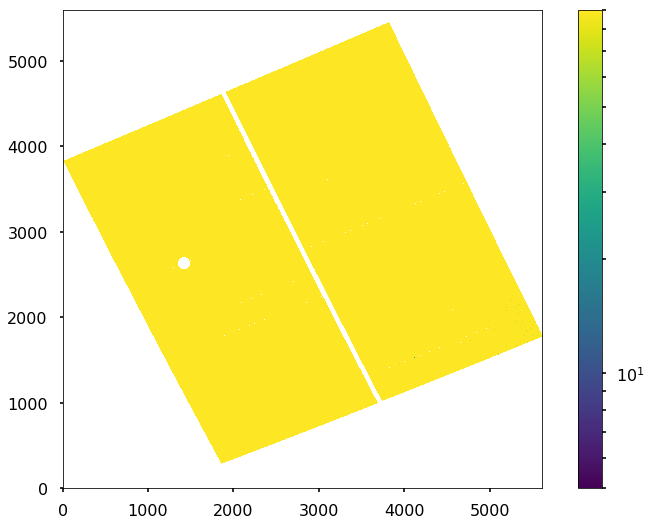

In [477]:
plt.imshow(im_F850LP, origin='lower', norm=mpl.colors.LogNorm(vmin=5, vmax=90))
plt.colorbar()

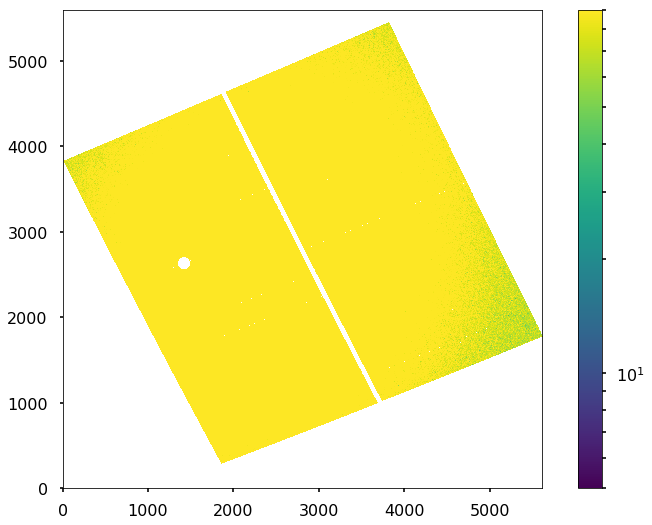

In [479]:
plt.imshow(im_F475W, origin='lower', norm=mpl.colors.LogNorm(vmin=5, vmax=90))
plt.colorbar()

## Step 3: Build detailed inner model

In [443]:
i_detailed = 55

In [444]:
%%time
im_model_F850LP_detailed = build_ellipse_model(im_shape,
                                              IsophoteList(isolist_F850LP[:i_detailed]), fill=90.)

CPU times: user 5min 3s, sys: 1.08 s, total: 5min 4s
Wall time: 5min 7s


In [480]:
%%time
im_model_F475W_detailed = build_ellipse_model(im_shape,
                                          IsophoteList(isolist_F475W[:i_detailed]), fill=60.)

CPU times: user 5min 38s, sys: 2.6 s, total: 5min 41s
Wall time: 5min 49s


In [445]:
im_model_F850LP = np.copy(im_model_F850LP_detailed)

In [490]:
im_model_F475W = np.copy(im_model_F475W_detailed)

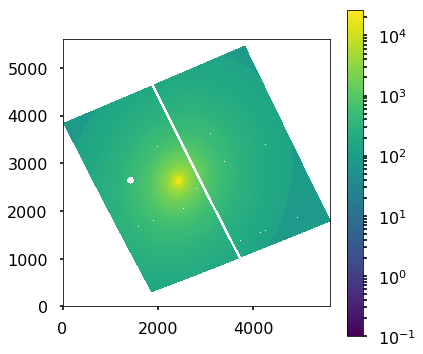

In [485]:
plt.figure(figsize=(6,6))
plt.imshow(im_model_F850LP, origin='lower', norm=mpl.colors.LogNorm(vmin=0.1))
plt.colorbar()

In [486]:
def get_aper(iso, sma=None):
    if sma is None:
        sma = iso.sma
    aper = EllipticalAperture((iso.x0, iso.y0), sma, sma*(1-iso.eps), iso.pa)
    return aper

In [487]:
def get_ellip_mask(im_shape, aper):
    aper_mask = aper.to_mask()[0]
    iso_mask = aper_mask.data.astype(bool)
    xmin = aper_mask.bbox.ixmin
    xmax = aper_mask.bbox.ixmax
    ymin = aper_mask.bbox.iymin
    ymax = aper_mask.bbox.iymax
    if (xmin < 0):
        dx = np.abs(xmin)
        xmin = 0
        iso_mask = iso_mask[:,dx:]
    if (xmax > im_shape[1]-1):
        dx = np.abs(xmax - im_shape[1] + 1)
        xmax = im_shape[1]-1
        iso_mask = iso_mask[:,:-dx]
    if (ymin < 0):
        dy = np.abs(ymin)
        ymin = 0
        iso_mask = iso_mask[dy:,:]
    if (ymax > im_shape[0]-1):
        dy = np.abs(ymax - im_shape[0] + 1)
        ymax = im_shape[0]-1
        iso_mask = iso_mask[:-dy,:]
    final_mask = np.zeros(im_shape).astype(bool)
    final_mask[ymin:ymax, xmin:xmax] = iso_mask
    return final_mask

## Step 4: Manually interpolate outer ellipses

In [449]:
# F850LP
for i in tqdm(range(len(isolist_F850LP)-1, i_detailed - 1 , -1), desc='Isophotes: '):
    this_iso = isolist_F850LP[i]
    next_iso = isolist_F850LP[i-1]
    next_ellipse = get_ellip_mask(im_shape, get_aper(next_iso))
    sma_max = this_iso.sma
    sma_min = 0.8*next_iso.sma
    #interpolate between 
    smas = np.linspace(sma_min, sma_max, 10)[::-1]
    for j in tqdm(range(len(smas)-1), desc='Interp.: ', leave=False):
        dr = (smas[j] - this_iso.sma)
        this_ellipse = get_ellip_mask(im_shape, get_aper(this_iso, sma=smas[j]))
#         next_ellipse = get_ellip_mask(im_shape, get_aper(this_iso, sma=smas[j+1]))
        iso_mask = np.logical_and(this_ellipse, ~next_ellipse)
        im_model_F850LP[iso_mask] = this_iso.intens + dr*this_iso.grad

HBox(children=(IntProgress(value=0, description='Isophotes: ', max=12), HTML(value='')))

HBox(children=(IntProgress(value=0, description='Interp.: ', max=9), HTML(value='')))

HBox(children=(IntProgress(value=0, description='Interp.: ', max=9), HTML(value='')))

HBox(children=(IntProgress(value=0, description='Interp.: ', max=9), HTML(value='')))

HBox(children=(IntProgress(value=0, description='Interp.: ', max=9), HTML(value='')))

HBox(children=(IntProgress(value=0, description='Interp.: ', max=9), HTML(value='')))

HBox(children=(IntProgress(value=0, description='Interp.: ', max=9), HTML(value='')))

HBox(children=(IntProgress(value=0, description='Interp.: ', max=9), HTML(value='')))

HBox(children=(IntProgress(value=0, description='Interp.: ', max=9), HTML(value='')))

HBox(children=(IntProgress(value=0, description='Interp.: ', max=9), HTML(value='')))

HBox(children=(IntProgress(value=0, description='Interp.: ', max=9), HTML(value='')))

HBox(children=(IntProgress(value=0, description='Interp.: ', max=9), HTML(value='')))

HBox(children=(IntProgress(value=0, description='Interp.: ', max=9), HTML(value='')))

In [498]:
# F475W
for i in tqdm(range(len(isolist_F475W)-1, i_detailed - 1, -1), desc='Isophotes: '):
    this_iso = isolist_F475W[i]
    next_iso = isolist_F475W[i-1]
    next_ellipse = get_ellip_mask(im_shape, get_aper(next_iso))
    sma_max = this_iso.sma
    sma_min = 0.8*next_iso.sma
    #interpolate between 
    smas = np.linspace(sma_min, sma_max, 10)[::-1]
    for j in tqdm(range(len(smas)-1), desc='Interp.: ', leave=False):
        dr = (smas[j] - this_iso.sma)
        this_ellipse = get_ellip_mask(im_shape, get_aper(this_iso, sma=smas[j]))
#         next_ellipse = get_ellip_mask(im_shape, get_aper(this_iso, sma=smas[j+1]))
        iso_mask = np.logical_and(this_ellipse, ~next_ellipse)
        im_model_F475W[iso_mask] = this_iso.intens + dr*this_iso.grad

HBox(children=(IntProgress(value=0, description='Isophotes: ', max=13), HTML(value='')))

HBox(children=(IntProgress(value=0, description='Interp.: ', max=9), HTML(value='')))

HBox(children=(IntProgress(value=0, description='Interp.: ', max=9), HTML(value='')))

HBox(children=(IntProgress(value=0, description='Interp.: ', max=9), HTML(value='')))

HBox(children=(IntProgress(value=0, description='Interp.: ', max=9), HTML(value='')))

HBox(children=(IntProgress(value=0, description='Interp.: ', max=9), HTML(value='')))

HBox(children=(IntProgress(value=0, description='Interp.: ', max=9), HTML(value='')))

HBox(children=(IntProgress(value=0, description='Interp.: ', max=9), HTML(value='')))

HBox(children=(IntProgress(value=0, description='Interp.: ', max=9), HTML(value='')))

HBox(children=(IntProgress(value=0, description='Interp.: ', max=9), HTML(value='')))

HBox(children=(IntProgress(value=0, description='Interp.: ', max=9), HTML(value='')))

HBox(children=(IntProgress(value=0, description='Interp.: ', max=9), HTML(value='')))

HBox(children=(IntProgress(value=0, description='Interp.: ', max=9), HTML(value='')))

HBox(children=(IntProgress(value=0, description='Interp.: ', max=9), HTML(value='')))

In [507]:
im_model_F850LP[mask] = 0.
im_model_F475W[mask] = 0.

In [508]:
resid_F850LP = im_F850LP - im_model_F850LP
resid_F475W = im_F475W - im_model_F475W

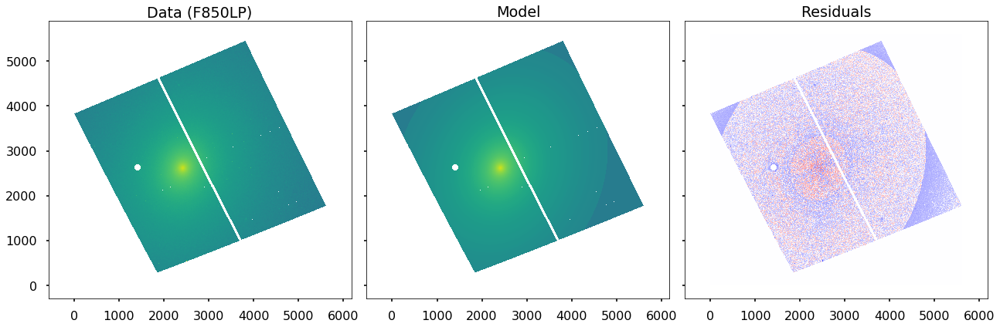

In [510]:
fig, axes = plt.subplots(ncols=3, figsize=(18,6), sharex=True, sharey=True)
norm=mpl.colors.LogNorm()
axes[0].imshow(im_F850LP, origin='lower', norm=norm)
axes[0].set_title('Data (F850LP)')
axes[1].imshow(im_model_F850LP, origin='lower', norm=norm)
axes[1].set_title('Model')
plt.subplot(axes[2])
plt.imshow(resid_F850LP, origin='lower', norm=mpl.colors.SymLogNorm(10, vmin=-vabs, vmax=vabs),
           cmap='bwr_r')
# plt.colorbar(ax=axes[2])
axes[2].set_title('Residuals')
plt.tight_layout()

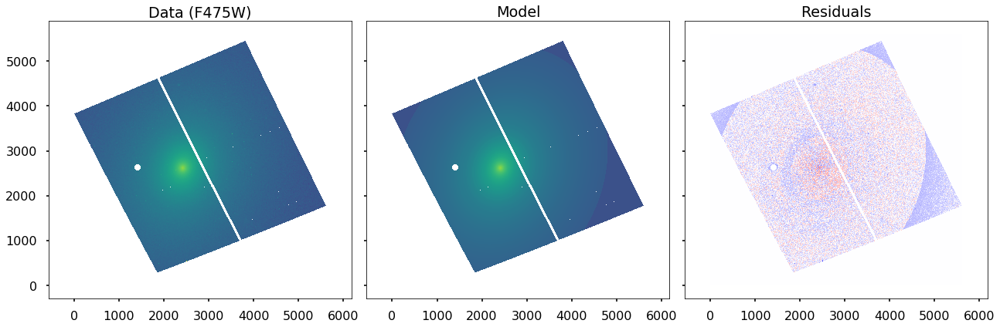

In [511]:
fig, axes = plt.subplots(ncols=3, figsize=(18,6), sharex=True, sharey=True)
norm=mpl.colors.LogNorm()
axes[0].imshow(im_F475W, origin='lower', norm=norm)
axes[0].set_title('Data (F475W)')
axes[1].imshow(im_model_F475W, origin='lower', norm=norm)
axes[1].set_title('Model')
plt.subplot(axes[2])
plt.imshow(resid_F475W, origin='lower', norm=mpl.colors.SymLogNorm(10, vmin=-vabs, vmax=vabs),
           cmap='bwr_r')
# plt.colorbar(ax=axes[2])
axes[2].set_title('Residuals')
plt.tight_layout()

In [616]:
resid_scaled_F850LP = (resid_F850LP)/im_model_F850LP
resid_scaled_F850LP[mask + dao_mask] = 0.
vabs_8 = np.max(np.abs(resid_scaled_F850LP))

/Users/bcook/anaconda/envs/py36/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: invalid value encountered in true_divide
  """Entry point for launching an IPython kernel.


In [617]:
resid_scaled_F475W = (resid_F475W)/im_model_F475W
resid_scaled_F475W[mask + dao_mask] = 0.
vabs_4 = np.max(np.abs(resid_scaled_F475W))

/Users/bcook/anaconda/envs/py36/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: invalid value encountered in true_divide
  """Entry point for launching an IPython kernel.


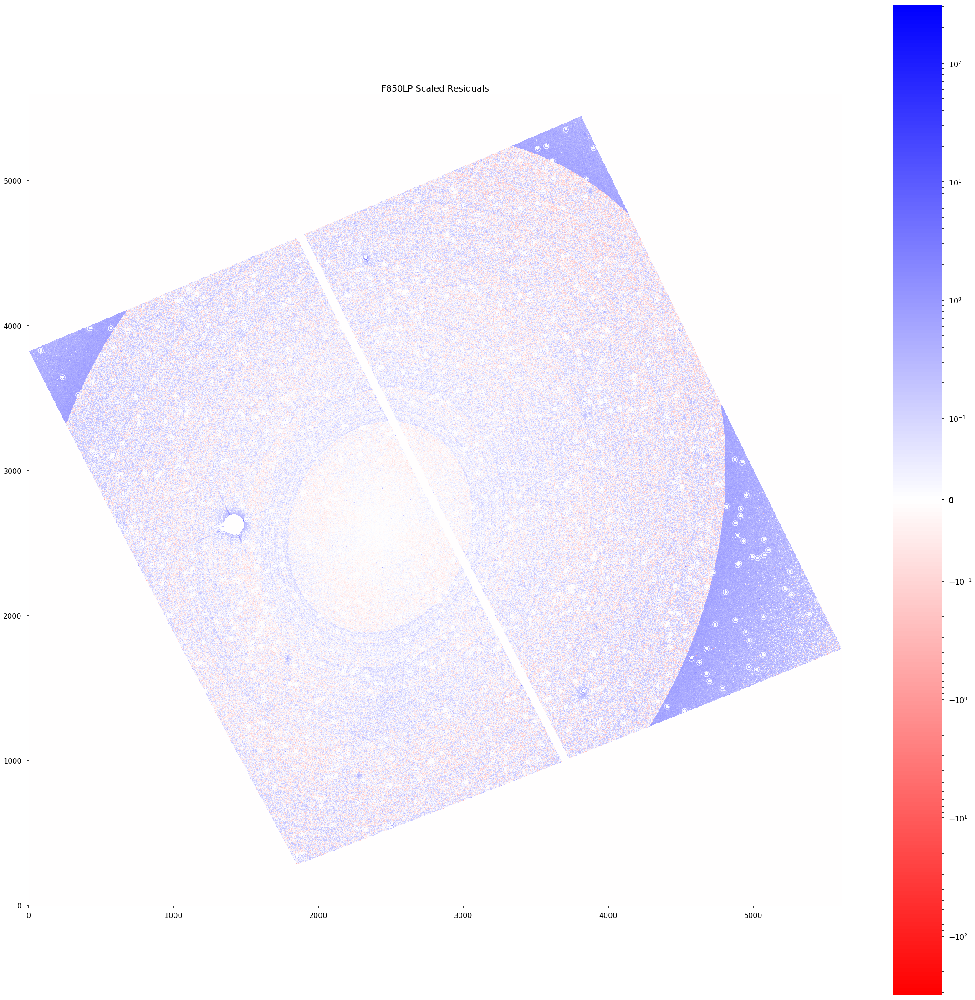

In [618]:
plt.figure(figsize=(40,40))
plt.imshow(resid_scaled_F850LP, origin='lower', norm=mpl.colors.SymLogNorm(.1, vmin=-vabs_8, vmax=vabs_8),
           cmap='bwr_r')
plt.plot(x1, y1, 'wo', mfc='None', mec='w', mew=1)
plt.plot(x2, y2, 'wo', mfc='None', mec='w', mew=1)
plt.title('F850LP Scaled Residuals')
plt.colorbar()

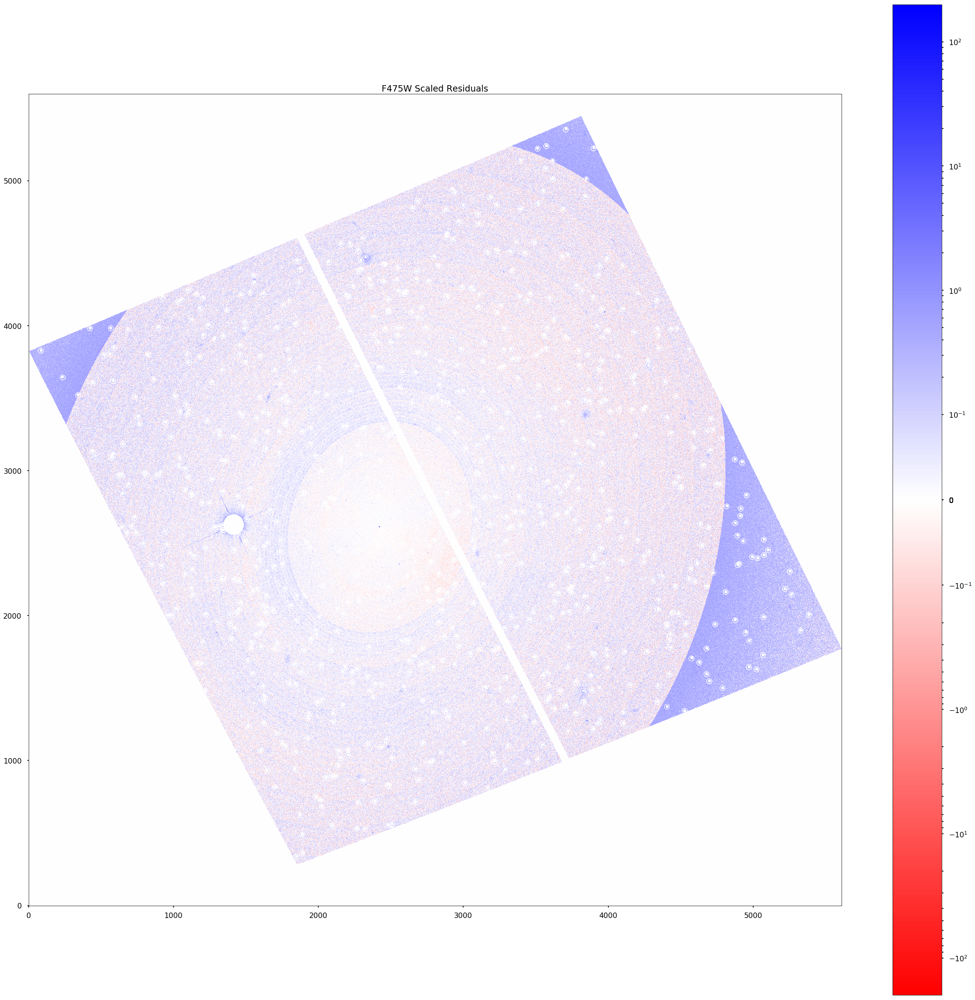

In [619]:
plt.figure(figsize=(40,40))
plt.imshow(resid_scaled_F475W, origin='lower', norm=mpl.colors.SymLogNorm(.1, vmin=-vabs_4, vmax=vabs_4),
           cmap='bwr_r')
plt.plot(x1, y1, 'wo', mfc='None', mec='w', mew=1)
plt.plot(x2, y2, 'wo', mfc='None', mec='w', mew=1)
plt.title('F475W Scaled Residuals')
plt.colorbar()

## Step 5: Save RESID maps

In [620]:
hdu_p = fits.PrimaryHDU()
hdu_c = fits.ImageHDU(resid_scaled_F850LP)
hdu_c.name = 'CLEAN'
hdu_r = fits.ImageHDU(resid_F850LP)
hdu_r.name = 'RESID'
hdu_m = fits.ImageHDU(im_model_F850LP)
hdu_m.name = 'MODEL'

hdul = fits.HDUList([hdu_p, hdu_c, hdu_r, hdu_m])
hdul.writeto('../data/m49_F850LP_resid.fits', overwrite=True)

In [622]:
hdu_p = fits.PrimaryHDU()
hdu_c = fits.ImageHDU(resid_scaled_F475W)
hdu_c.name = 'CLEAN'
hdu_r = fits.ImageHDU(resid_F475W)
hdu_r.name = 'RESID'
hdu_m = fits.ImageHDU(im_model_F475W)
hdu_m.name = 'MODEL'

hdul = fits.HDUList([hdu_p, hdu_c, hdu_r, hdu_m])
hdul.writeto('../data/m49_F475W_resid.fits', overwrite=True)

## Step 6: Classify regions (by isophote)

https://github.com/astropy/photutils-datasets/blob/master/notebooks/isophote/isophote_example4.ipynb

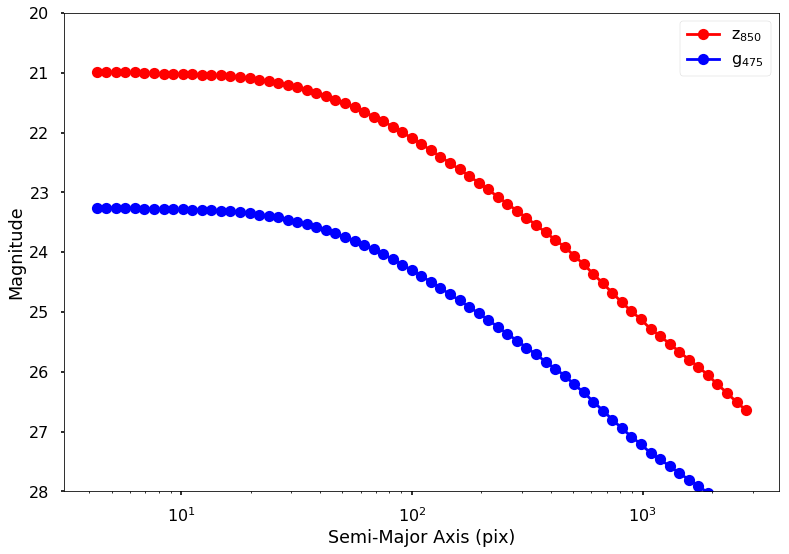

In [518]:
plt.plot(isolist_F850LP.sma, f[0].counts_to_mag(isolist_F850LP.intens), 'r-o', label=f[0].tex_name)
plt.plot(isolist_F475W.sma, f[1].counts_to_mag(isolist_F475W.intens), 'b-o', label=f[1].tex_name)
plt.ylim([28, 20])
plt.xscale('log')
plt.ylabel('Magnitude')
plt.xlabel('Semi-Major Axis (pix)')
plt.legend(loc=0)

In [539]:
all_apers = [get_aper(iso) for iso in isolist_F850LP]
all_masks = [get_ellip_mask(im_shape, all_apers[0])]

this_mask = all_masks[-1]
for i in tqdm(range(1, len(all_apers))):
    old_mask = this_mask
    this_mask = get_ellip_mask(im_shape, all_apers[i])
    annulus_mask = np.logical_and(this_mask, ~old_mask)
    all_masks.append(annulus_mask)

HBox(children=(IntProgress(value=0, max=68), HTML(value='')))

In [579]:
Nim_eff = [np.sqrt(np.sum(m)) for m in all_masks]

(Text(0.5,0,'Semi-Major Axis (pix)'), Text(0,0.5,'N$_{eff}$'))

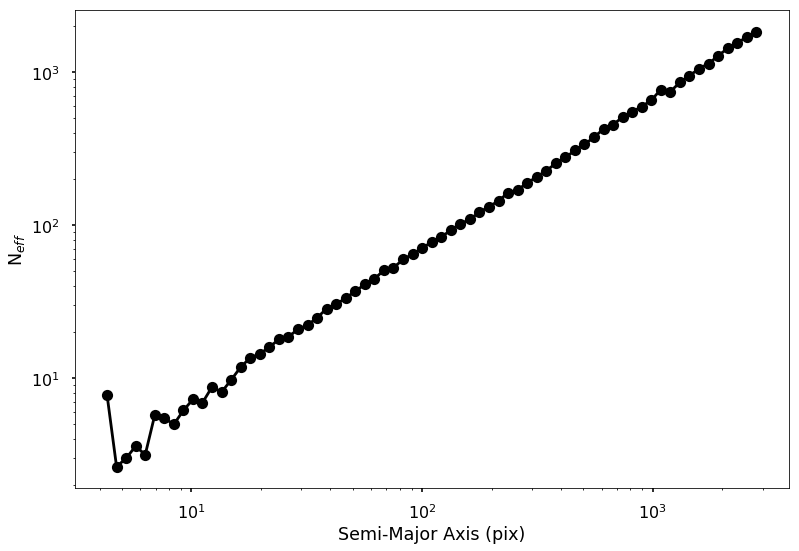

In [580]:
plt.plot(isolist_F850LP.sma, Nim_eff, 'k-o')
plt.xscale('log'), plt.yscale('log')
plt.xlabel('Semi-Major Axis (pix)'), plt.ylabel(r'N$_{eff}$')

In [586]:
region_ids = np.zeros(im_shape).astype(int)

for i in range(len(all_masks)):
    region_ids[all_masks[i]] = i+1
region_ids[mask] = -1
region_ids[dao_mask] = -2

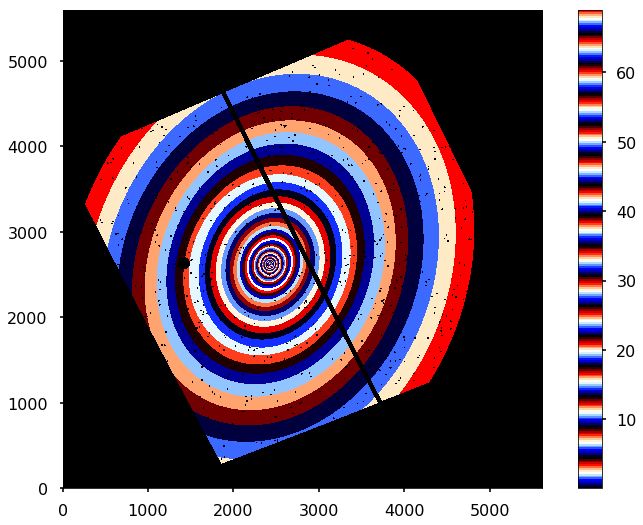

In [587]:
plt.imshow(region_ids, cmap='flag_r', origin='lower', vmin=0.1)
plt.colorbar()

In [557]:
hdu_p = fits.PrimaryHDU()
hdu_r = fits.ImageHDU(region_ids)
hdu_r.name = 'IDS'

hdul = fits.HDUList([hdu_p, hdu_r, hdu_m])
hdul.writeto('../data/m49_isophot_ids.fits', overwrite=True)

## Step 7: Find unmasked points

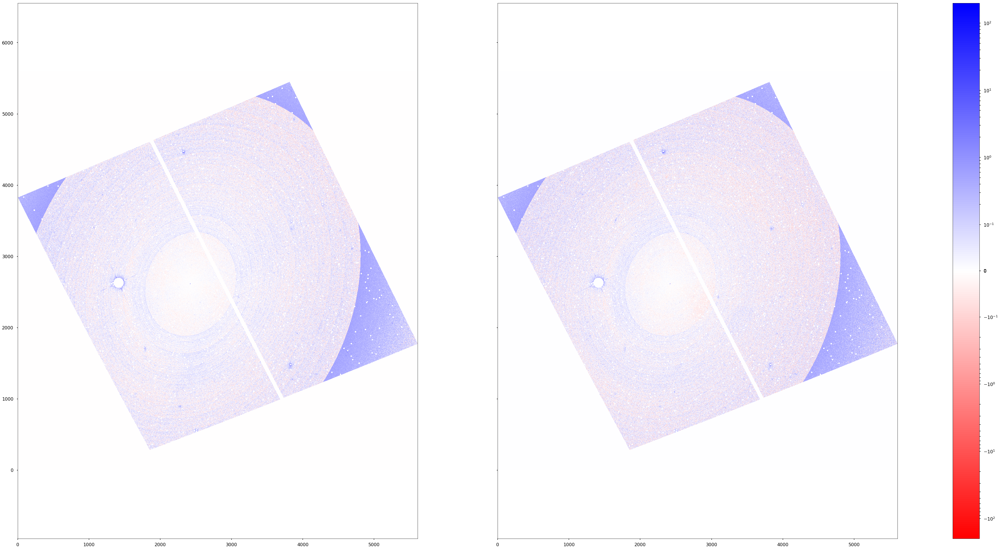

In [613]:
fig, axes = plt.subplots(ncols=2, figsize=(70, 35), sharex=True, sharey=True)
plt.subplot(axes[0])
plt.imshow(ratio_F850LP, origin='lower',
           norm=mpl.colors.SymLogNorm(0.1, vmin=-vabs_8, vmax=vabs_8), cmap='bwr_r')
plt.subplot(axes[1])
plt.imshow(ratio_F475W, origin='lower', norm=mpl.colors.SymLogNorm(0.1, vmin=-vabs_4, vmax=vabs_4),
          cmap='bwr_r')
plt.colorbar(ax=axes)

In [23]:
def showcase_region(xlim=None, ylim=None, b=None, mag_noise=0., title=None):
    fig = plt.figure(figsize=(16, 10))
    gs0 = gridspec.GridSpec(2,3)
    ax1 = plt.subplot(gs0[:,1:])
    ax1.set_yticks([])
    ax1.set_xticks([])
    ax2 = plt.subplot(gs0[0,0])
    ax2.yaxis.get_major_locator().set_params(nbins=2)
    ax2.xaxis.get_major_locator().set_params(nbins=2)
    ax3 = plt.subplot(gs0[1,0])

    if b is None:
        b = make_bools(xlim, ylim)
    else:
        ys, xs = np.where(b)
        xlim = [min(xs), max(xs)]
        ylim = [min(ys), max(ys)]
    im, ext = m49.get_image(b)
    im = make_rgb_image(im)
    
    pcmd = m49.get_pcmd(b)

    ax1 = ppy.plotting.plot_rgb_image(im_full, extent=(0, im_full.shape[1], 0, im_full.shape[0]), ax=ax1, clip_vals=full_clip(99.))
    x1, x2 = xlim
    y1, y2 = ylim
    ax2 = ppy.plotting.plot_rgb_image(im, ax=ax2, clip_vals=full_clip(99.), extent=(x1, x2, y1, y2))
    mark_inset(ax1, ax2, loc1=1, loc2=3, ec='r', lw=1)
    ppy.plotting.plot_pcmd(pcmd, axes=ax3)
    ppy.plotting.plot_isochrone(iso_model, dmod=31.29, axes=ax3, zorder=-1)
    for a in [ax3]:
        a.set_ylim([37., 24.])
        if mag_noise > 0.:
            a.axhline(y=mag_noise, ls='--', color='r')
    if title is not None:
        ax2.set_title(title, fontsize=24)
    plt.tight_layout()

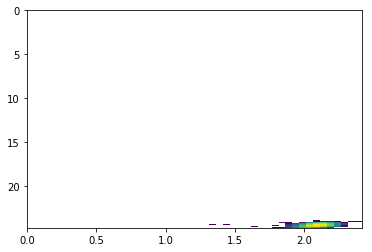

In [238]:
ppy.plotting.plot_pcmd(pcmd_data)
plt.;

In [236]:
pcmd_data = np.loadtxt('/Users/bcook/pCMDs/pixcmd/data/m49_testannulus_z-gz.dat', unpack=True)

In [ ]:
def save_pcmd(name):
    xlim, ylim = regions[name]
    pcmd_data = pcmds[name]
    base_info = 'Vega Mags\n{:s} region extracted from square X=[{:d},{:d}), Y=[{:d}, {:d}) from M51 image'.format(name, int(xlim[0]), int(xlim[1]), int(ylim[0]), int(ylim[1]))
    filename = '../data/test4x_m51_{:s}_I-VI-BV.dat'.format(name)
    np.savetxt(filename, pcmd_data.T, fmt='%.6f', header=base_info+'\nImag Vmag-Imag Bmag-Vmag\nF814W F555W-F814W F435W-F555W')
    print('saved to: {:s}'.format(filename))

In [235]:
base_info = 'Vega Mags\nAnnulus region extracted from X0,Y0=(2413, 2623), R1,R2=(500,600), T1,T2=(pi/2, pi) from M49\n'
filename = '/Users/bcook/pCMDs/pixcmd/data/m49_testannulus_z-gz.dat'
np.savetxt(filename, pcmd.T, fmt='%.6f', header=base_info+'zmag gmag-zmag\nF850LP F475W-F850LP')
print('saved to {:s}'.format(filename))

saved to /Users/bcook/pCMDs/pixcmd/data/m49_testannulus_z-gz.dat


In [227]:
pcmd = m49.get_pcmd(b)
np.sqrt(len(pcmd[0]))

290.52710716902135

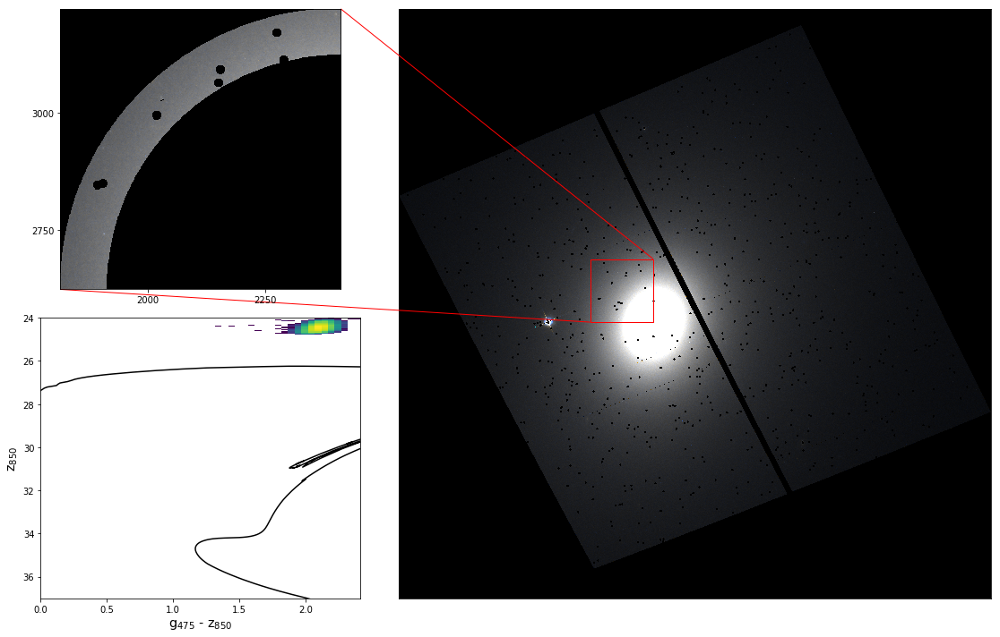

In [220]:
showcase_region(b=b)

In [219]:
%%time
b = annulus_bools(2413, 2623, [500, 600], [np.pi/2., np.pi])

CPU times: user 2.02 s, sys: 800 ms, total: 2.82 s
Wall time: 2.85 s


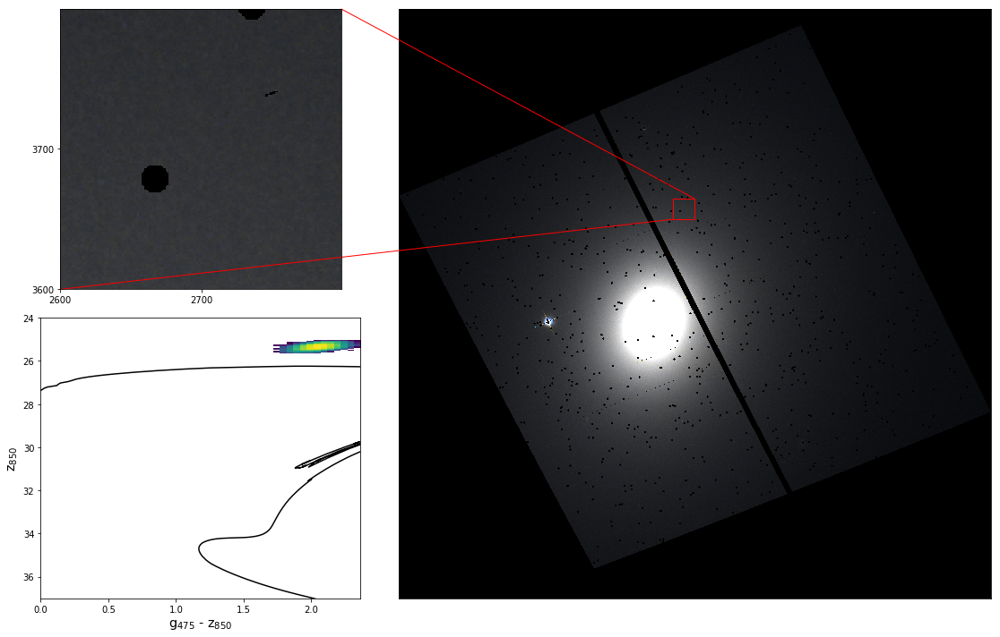

In [27]:
showcase_region(b=b)

In [26]:
%%time
b = square_bools([2600, 2800], [3600, 3800])

CPU times: user 654 ms, sys: 58.3 ms, total: 713 ms
Wall time: 718 ms


In [144]:
%%time
model_image_F475W = build_ellipse_model(im_shape, isolist_F475W)

KeyboardInterrupt: 

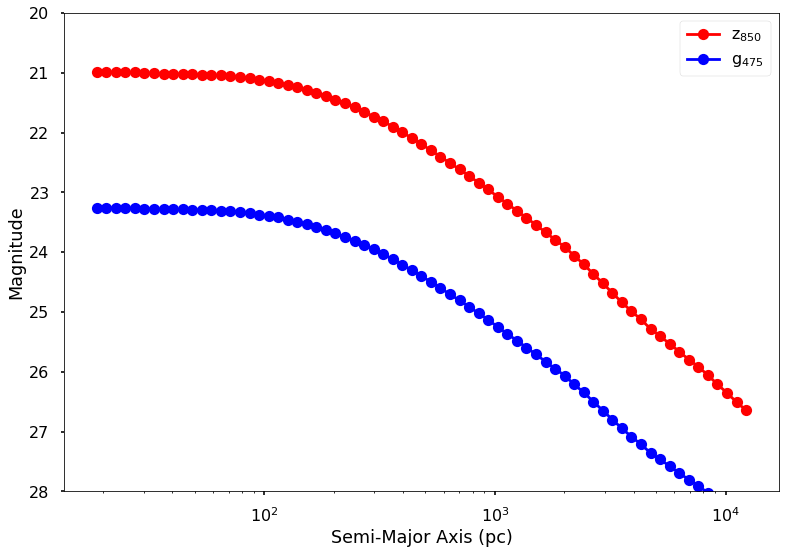

In [357]:
plt.plot(isolist_F850LP.sma * pix_in_pc, f[0].counts_to_mag(isolist_F850LP.intens), 'r-o', label=f[0].tex_name)
plt.plot(isolist_F475W.sma * pix_in_pc, f[1].counts_to_mag(isolist_F475W.intens), 'b-o', label=f[1].tex_name)
plt.ylim([28, 20])
plt.xscale('log')
plt.ylabel('Magnitude')
plt.xlabel('Semi-Major Axis (pc)')
plt.legend(loc=0)

In [19]:
pix_in_pc

4.363323129985824